In [4]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import re
import numpy as np
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
import nltk
from nltk.corpus import stopwords
import sklearn
from nltk import pos_tag
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from textblob import Word

In [5]:
#Load dataset - update variable folder_path to desired path upon re-use.
folder_path = '/home/disessa.j/CapstoneFiles'
job_df = []

for file in os.listdir(folder_path):
    if file.endswith(".xlsx"):
        excel_file = pd.ExcelFile(os.path.join(folder_path, file))
        for sheet_name in excel_file.sheet_names:
            df = pd.read_excel(excel_file, sheet_name=sheet_name)
            df["job_bucket"] = sheet_name
            job_df.append(df)
            
df = pd.concat(job_df, ignore_index=True)
df.head(5)

,URL,SIP CODE,Job Title,Job Description,job_bucket
0,https://www.linkedin.com/jobs/view/3326065652/...,15-2041.01,Bioinformatics Analyst I,Overview\n\nFred Hutchinson Cancer Center is a...,biostatistics
1,https://www.linkedin.com/jobs/view/3331968276/...,15-2041.01,Bioinformatics Analyst I,Overview\n\nFred Hutchinson Cancer Center is a...,biostatistics
2,https://www.linkedin.com/jobs/view/3305254606/...,15-2041.01,Senior Biostatistician II,Description\n\nPosition at Seagen\n\nSeagen is...,biostatistics
3,https://www.linkedin.com/jobs/view/3308845595/...,15-2041.01,Bioinformatics Analyst,Bioinformatics Analyst I – Operations\n\nThe m...,biostatistics
4,https://www.linkedin.com/jobs/view/3179427659/...,15-2041.01,Biostatistician III,Responsibilities\n\nWork independently to deve...,biostatistics


In [6]:
#Basic DF info
df.info()

#Data Cleaning - Drop NA values, clean strings for Job Title.
df.isnull().sum()
df = df.dropna()
df.columns = df.columns.str.replace(' ', '') #clear whitespace in col name
df.columns = df.columns.str.lower() #make col name lowercase
df['jobtitle'] = df['jobtitle'].apply(str.lower) #make job title values lowercase

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10210 entries, 0 to 10209
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   URL              10139 non-null  object
 1   SIP CODE         10210 non-null  object
 2   Job Title        10139 non-null  object
 3   Job Description  10139 non-null  object
 4   job_bucket       10210 non-null  object
dtypes: object(5)
memory usage: 399.0+ KB


<AxesSubplot:title={'center':'Top 10 Job Titles in Data'}>

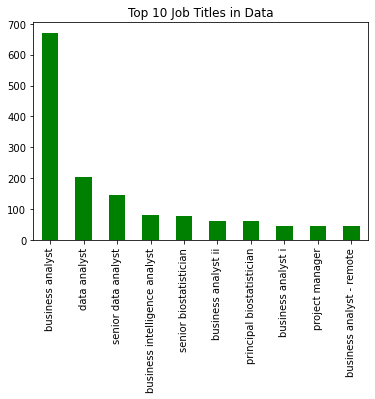

In [7]:
#EDA
df['jobtitle'].value_counts()[:10].plot(x="Job Title", y="Count", kind="bar", title="Top 10 Job Titles in Data", color='green')

<AxesSubplot:title={'center':'Top 10 Non-Analyst Job Titles in Data'}>

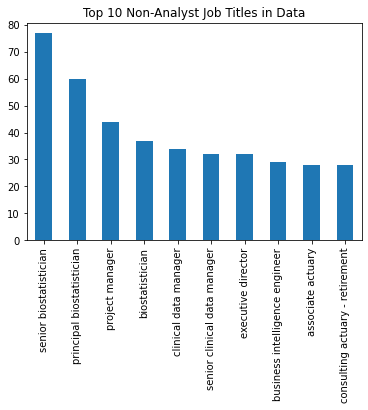

In [8]:
#EDA
df_eda1 = df[df['jobtitle'].str.contains("analyst") == False]
df_eda1['jobtitle'].value_counts()[:10].plot(x="Job Title", y="Count", kind="bar", title="Top 10 Non-Analyst Job Titles in Data")

<AxesSubplot:title={'center':"Top 10 Job Titles in Data with 'Director' in Title"}>

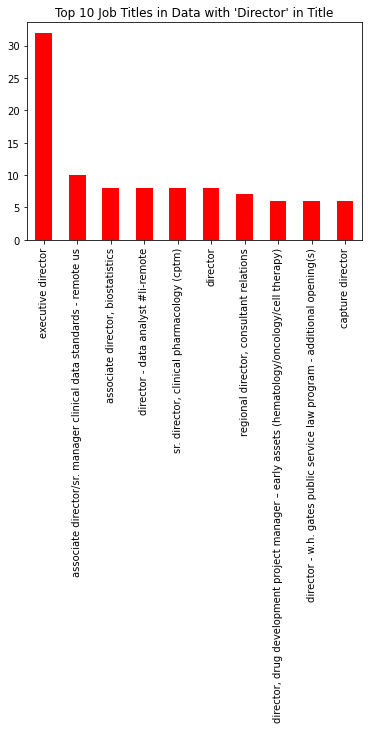

In [9]:
#EDA
df_eda2 = df[df['jobtitle'].str.contains("director") == True]
df_eda2['jobtitle'].value_counts()[:10].plot(x="Job Title", y="Count", kind="bar", title="Top 10 Job Titles in Data with 'Director' in Title", color="red")

In [10]:
#Data Cleaning - Clean strings
def clean_text(text):
    text = text.lower() # convert letters to lower case
    text = re.sub("[^a-zA-Z]", " ", text) # remove non-letters
    text = re.sub(r'\d+', '', text) # remove number
    text = re.sub(r'http\S+', '', text) # remove links
    text = re.sub(' +', ' ',text) # remove extra space
    text = text.strip() # remove whitespaces
    return text

df['jobtitle'] = df['jobtitle'].apply(clean_text)
df['jobdescription'] = df['jobdescription'].apply(clean_text)
df['job_bucket'] = df['job_bucket'].apply(clean_text)

#Removal of non-entry-level jobs
entry_df = df[df['jobtitle'].str.contains("manager|director|senior|sr")==False] #Removal of Senior-Level Positions & Job Classification (Temp)
entry_df.drop_duplicates()
entry_df.info() #Check size of new, clean dataframe.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6629 entries, 0 to 10209
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   url             6629 non-null   object
 1   sipcode         6629 non-null   object
 2   jobtitle        6629 non-null   object
 3   jobdescription  6629 non-null   object
 4   job_bucket      6629 non-null   object
dtypes: object(5)
memory usage: 310.7+ KB


In [11]:
#Removal of english stopwords found in nltk package.
stop = stopwords.words('english')
entry_df['jobdescription'] = entry_df['jobdescription'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

<ipython-input-11-1ffac27a2eb0>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entry_df['jobdescription'] = entry_df['jobdescription'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))


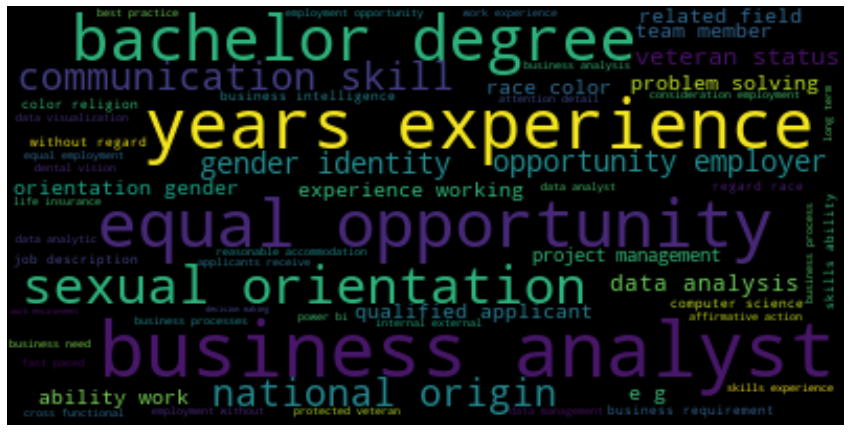

In [12]:
#WordCloud 1 - Full Data (post cleaning & stopword removal)
text = " ".join(i for i in entry_df['jobdescription'])
wordcloud = WordCloud(stopwords=stop, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

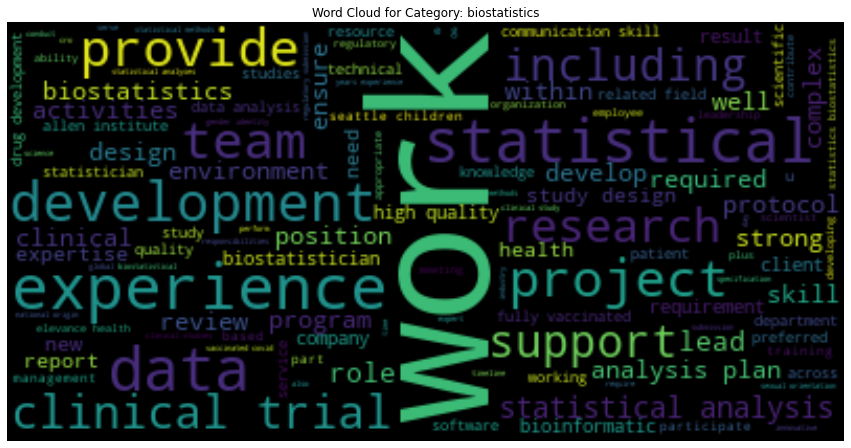

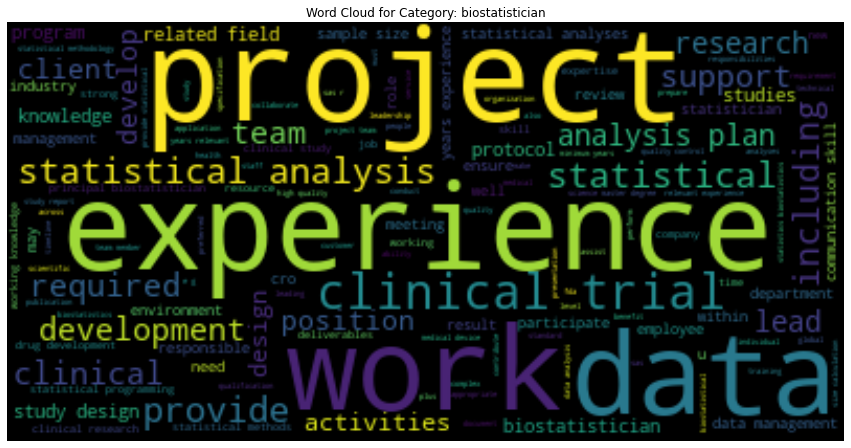

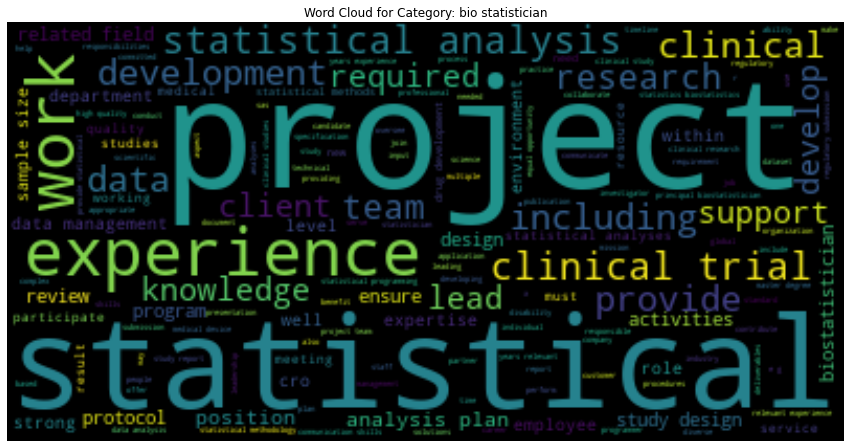

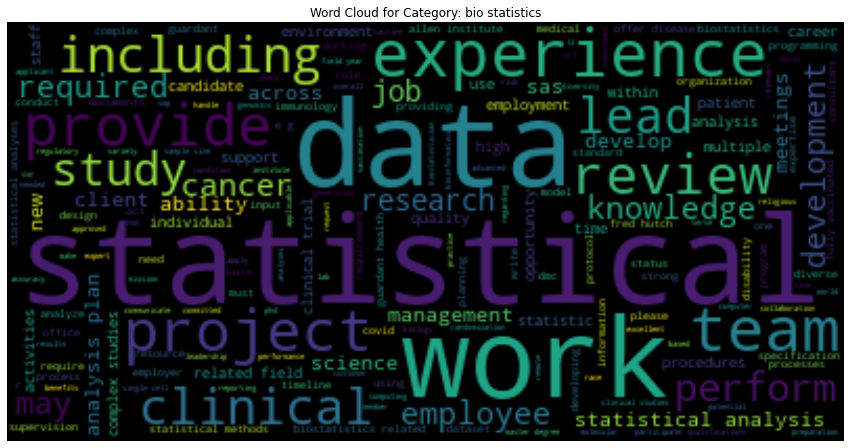

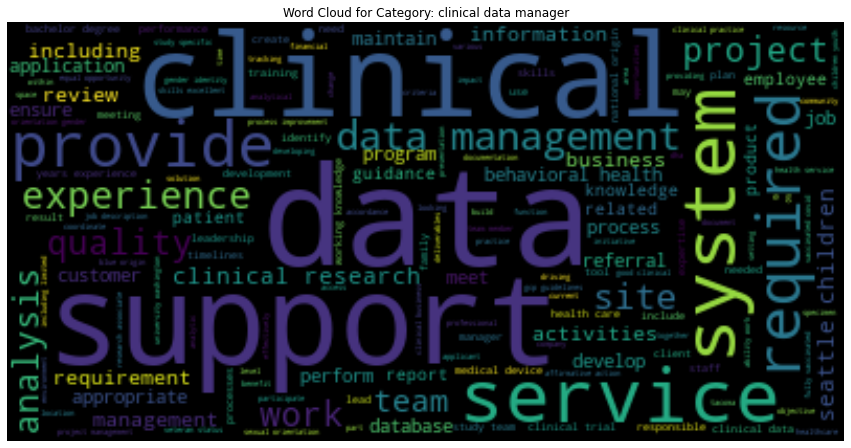

...

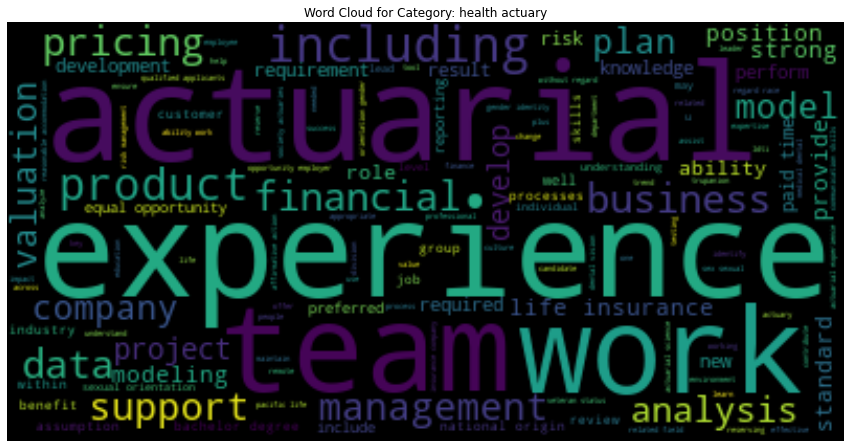

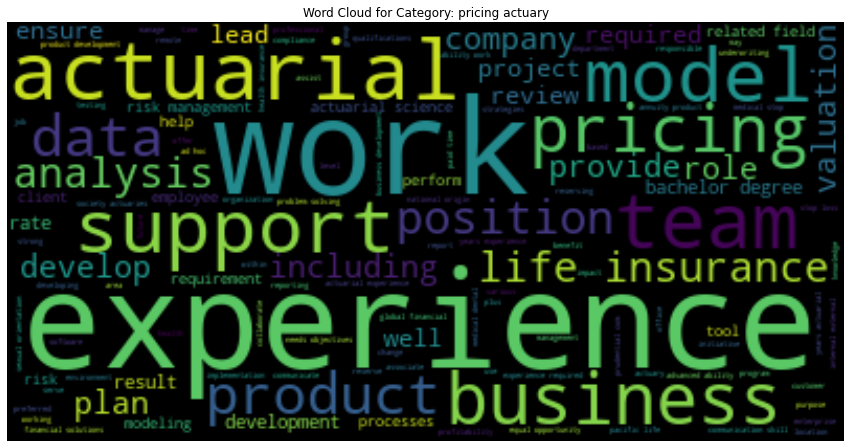

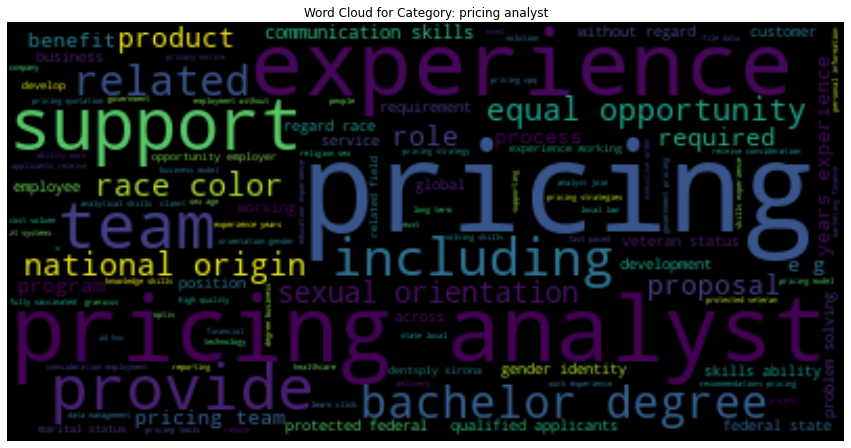

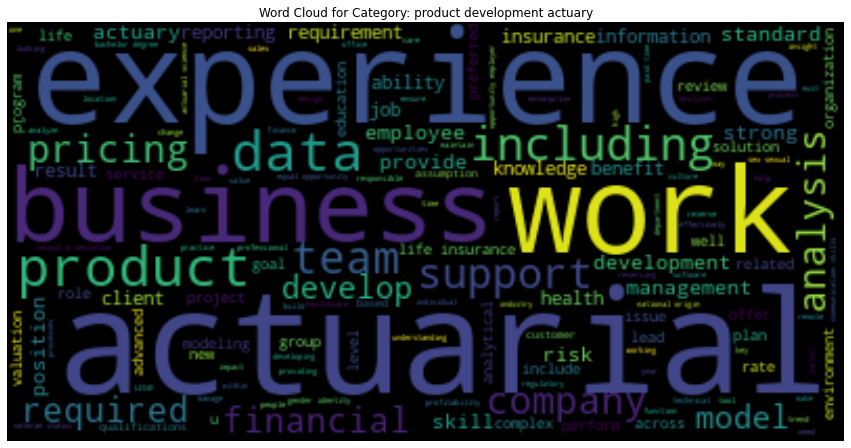

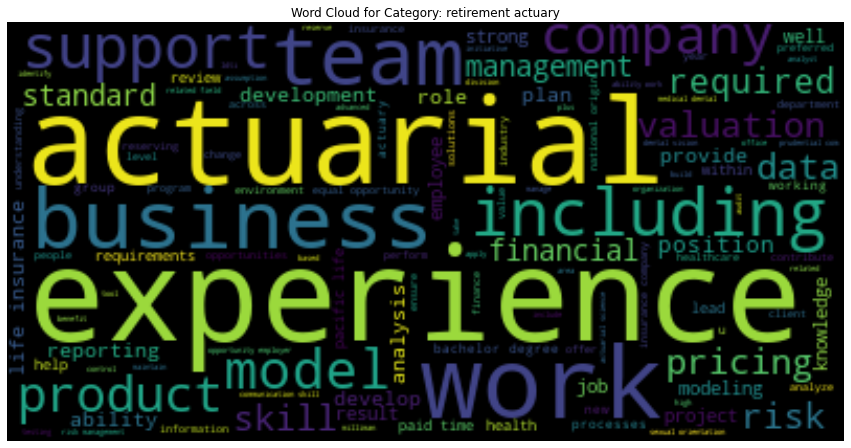

In [13]:
#WordClouds - Per Job Classification (use in collaboration with qualitative research to compose keyword list)
for bucket in entry_df['job_bucket'].unique():
    sub_df = entry_df[entry_df['job_bucket'] == bucket]
    text_main = " ".join(i for i in sub_df['jobdescription'])
    wordcloud_main = WordCloud(stopwords=stop, background_color="black").generate(text_main)
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud_main, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud for Category: {bucket}")
    plt.show()

In [121]:
#Keywords created through qualitative research - need to expand
keywords = set(['python', 'pytorch', 'sql', 'sas', 'java', 'nosql', 'docker', 'salesforce', 'scala', 'r', 'rstudio',
 'c', 'net', 'tableau', 'pandas', 'scikitlearn', 'sklearn', 'matlab', 'scala', 'keras', 'tensorflow', 'clojure',
 'caffe', 'scipy', 'numpy', 'matplotlib', 'vba', 'spss', 'linux', 'azure', 'cloud', 'gcp', 'mongodb', 'mysql', 'oracle', 
 'redshift', 'snowflake', 'kafka', 'javascript', 'qlik', 'jupyter', 'perl', 'bigquery', 'unix', 'react',
 'scikit', 'powerbi', 's3', 'ec2', 'lambda', 'ssrs', 'kubernetes', 'hana', 'spacy', 'tf', 'django', 'sagemaker',
 'seaborn', 'mllib', 'github', 'git', 'elasticsearch', 'splunk', 'unixlinux', 'postgres', 'aws', 'excel', 'microsoft',
 'word', 'communication', 'powerpoint', 'powershell', 'powerbi', 'visualization', 'dashboard', 'nosql', 'statistics',
 'math', 'mathematics', 'stat'])
pos_tag(keywords)

[('perl', 'NN'),
 ('react', 'JJ'),
 ('r', 'JJ'),
 ('net', 'JJ'),
 ('spacy', 'NN'),
 ('scikitlearn', 'NN'),
 ('unixlinux', 'JJ'),
 ('unix', 'JJ'),
 ('powershell', 'NN'),
 ('snowflake', 'VB'),
 ('gcp', 'JJ'),
 ('scala', 'JJ'),
 ('splunk', 'NN'),
 ('mathematics', 'NNS'),
 ('visualization', 'NN'),
 ('microsoft', 'RB'),
 ('mongodb', 'JJ'),
 ('s3', 'NN'),
 ('java', 'NN'),
 ('pandas', 'NN'),
 ('hana', 'NN'),
 ('numpy', 'JJ'),
 ('keras', 'NNS'),
 ('git', 'VBP'),
 ('python', 'JJ'),
 ('caffe', 'NN'),
 ('salesforce', 'NN'),
 ('sql', 'NN'),
 ('postgres', 'NNS'),
 ('powerpoint', 'VBP'),
 ('sklearn', 'JJ'),
 ('aws', 'NNS'),
 ('javascript', 'VBP'),
 ('qlik', 'JJ'),
 ('tf', 'NN'),
 ('linux', 'NN'),
 ('sagemaker', 'NN'),
 ('azure', 'NN'),
 ('django', 'NN'),
 ('mllib', 'NN'),
 ('scipy', 'NN'),
 ('lambda', 'NN'),
 ('kubernetes', 'VBZ'),
 ('bigquery', 'IN'),
 ('statistics', 'NNS'),
 ('powerbi', 'VBP'),
 ('jupyter', 'NN'),
 ('kafka', 'NN'),
 ('communication', 'NN'),
 ('rstudio', 'NN'),
 ('matlab', 'NN'),
 

In [122]:
lem = WordNetLemmatizer()

#Master function - used to prepare job descriptions.
#Contains steps for tokenization, parts-of-speech tagging, and lemmatization.
#Stemming was explored, but was significantly more computationally intensive - took too long to run.
def master_func(job_desc):
    tokens = word_tokenize(job_desc)        
    t_tag = pos_tag(tokens)    
    tag_abbv_list = ['NN', 'JJ', 'VB', 'NNS', 'RB', 'VBZ', 'IN', 'VBP', 'VBN']
    f_tokens = [tok for tok, tag in t_tag if tag in tag_abbv_list]
    lemma_token = [lem.lemmatize(tok).lower() for tok in f_tokens]    
    return set(lemma_token)

entry_df['jd_words'] = entry_df['jobdescription'].map(master_func)

#Lemmatization on original keywords
ks1 = set([lem.lemmatize(tok) for tok in keywords])
ks1_d = {lem.lemmatize(tok):tok for tok in keywords}

C:\Users\ebrem\AppData\Local\Temp\ipykernel_14908\3404271466.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [123]:
skillz_master = []

#For loop to loop through job descriptions and match keywords to values based on token value.
num_postings = len(entry_df['jobdescription'].index)
for i in range(num_postings):
    jd_loc = entry_df.iloc[i]['jobdescription'].lower()
    jd_set = entry_df.iloc[i]['jd_words']    
    skillz = ks1.intersection(jd_set)     
    skillz_master += list(skillz)

In [124]:
#Create new dataframe for a sum of skills
df_skill = pd.DataFrame(data={'Count': skillz_master})
df_skill = df_skill.replace(ks1_d)

#Create new dataframe that contains count of skills and skill name from skill dictionary
df_skill10 = df_skill['Count'].value_counts().reset_index().rename(columns={'index': 'Skill'}).iloc[:10]
df_skill10.head(10)

,Skill,Count
0,communication,3953
1,sql,2630
2,excel,2193
3,visualization,1414
4,dashboard,1381
5,python,1374
6,statistics,1341
7,microsoft,1336
8,tableau,1332
9,r,1087


<AxesSubplot:title={'center':'Top 10 Skills Across All In-Scope Jobs'}, xlabel='Skill'>

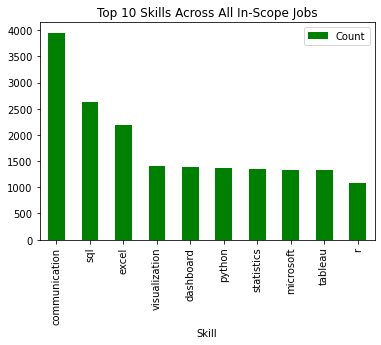

In [125]:
#Visualize the top 10 skills found across all job descriptions.
df_skill10.plot(x="Skill",y="Count",title="Top 10 Skills Across All In-Scope Jobs", kind="bar", color='green')

In [126]:
#Create new dataframe for a sum of skills
df_skill = pd.DataFrame(data={'Count': skillz_master})
df_skill = df_skill.replace(ks1_d)

#Create new dataframe that contains count of skills and skill name from skill dictionary
df_skill_bot10 = df_skill['Count'].value_counts().reset_index().rename(columns={'index': 'Skill'})
df_skill_bot10.tail(10)

,Skill,Count
57,scikit,14
58,hana,14
59,scipy,13
60,splunk,13
61,sagemaker,12
62,django,11
63,keras,6
64,elasticsearch,6
65,seaborn,3
66,sklearn,2


<AxesSubplot:title={'center':'Bottom 10 Skills Across All In-Scope Jobs'}, xlabel='Skill'>

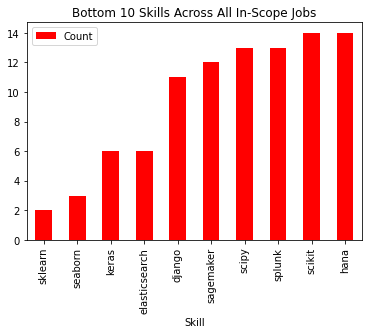

In [127]:
#Visualize the bottom 10 skills found across all job descriptions.
df_skill_bot10.nsmallest(10, ['Count']).plot(x="Skill",y="Count",title="Bottom 10 Skills Across All In-Scope Jobs", kind="bar", color='red')

In [16]:
#JOB TITLE SPECIFIC USECASE
#Bioinformatics

#subset of bioinformatics entry level positions
entry_dfBio = entry_df[entry_df['jobtitle'].str.contains(r'.*bioinformatics.*')]

In [17]:
#Bioinformatics Skills
keywordsBioinformatics = set(['python', 'pytorch', 'sql', 'sas', 'java', 'nosql', 'docker', 'salesforce', 'scala', 'r', 'rstudio',
 'c', 'net', 'tableau', 'pandas', 'scikitlearn', 'sklearn', 'matlab', 'scala', 'keras', 'tensorflow', 'clojure',
 'caffe', 'scipy', 'numpy', 'matplotlib', 'vba', 'spss', 'linux', 'azure', 'cloud', 'gcp', 'mongodb', 'mysql', 'oracle', 
 'redshift', 'snowflake', 'kafka', 'javascript', 'qlik', 'jupyter', 'perl', 'bigquery', 'unix', 'react',
 'scikit', 'powerbi', 's3', 'ec2', 'lambda', 'ssrs', 'kubernetes', 'hana', 'spacy', 'tf', 'django', 'sagemaker',
 'seaborn', 'mllib', 'github', 'git', 'elasticsearch', 'splunk', 'unixlinux', 'postgres', 'aws', 'excel', 'microsoft',
 'word', 'communication', 'powerpoint', 'powershell', 'powerbi', 'visualization', 'dashboard', 'nosql', 'statistics',
 'math', 'mathematics', 'stat','database', 'clinical','reporting','organization'])

pos_tag(keywordsBioinformatics)

[('pandas', 'JJ'),
 ('visualization', 'NN'),
 ('spacy', 'NN'),
 ('database', 'NN'),
 ('oracle', 'NN'),
 ('salesforce', 'NN'),
 ('r', 'NN'),
 ('git', 'NN'),
 ('qlik', 'NN'),
 ('pytorch', 'NN'),
 ('powershell', 'NN'),
 ('sas', 'JJ'),
 ('azure', 'NN'),
 ('kafka', 'NN'),
 ('mathematics', 'NNS'),
 ('vba', 'VBP'),
 ('tableau', 'JJ'),
 ('aws', 'JJ'),
 ('bigquery', 'NN'),
 ('seaborn', 'JJ'),
 ('organization', 'NN'),
 ('perl', 'NN'),
 ('mllib', 'NN'),
 ('java', 'NN'),
 ('python', 'NN'),
 ('excel', 'VBP'),
 ('redshift', 'NN'),
 ('powerpoint', 'NN'),
 ('kubernetes', 'VBZ'),
 ('reporting', 'VBG'),
 ('snowflake', 'VB'),
 ('s3', 'JJ'),
 ('docker', 'NN'),
 ('matplotlib', 'NN'),
 ('django', 'NN'),
 ('rstudio', 'NN'),
 ('tensorflow', 'JJ'),
 ('net', 'JJ'),
 ('javascript', 'NN'),
 ('scipy', 'NN'),
 ('splunk', 'NN'),
 ('github', 'NN'),
 ('matlab', 'NN'),
 ('nosql', 'JJ'),
 ('react', 'JJ'),
 ('unix', 'JJ'),
 ('linux', 'NN'),
 ('elasticsearch', 'NN'),
 ('c', 'NN'),
 ('lambda', 'NN'),
 ('word', 'NN'),
 ('mi

In [19]:
lem = WordNetLemmatizer()

#Master function - used to prepare job descriptions.
#Contains steps for tokenization, parts-of-speech tagging, and lemmatization.
#Stemming was explored, but was significantly more computationally intensive - took too long to run.
def master_func(job_desc):
    tokens = word_tokenize(job_desc)        
    t_tag = pos_tag(tokens)    
    tag_abbv_list = ['NN', 'JJ', 'VB', 'NNS', 'RB', 'VBZ', 'IN', 'VBP', 'VBN']
    f_tokens = [tok for tok, tag in t_tag if tag in tag_abbv_list]
    lemma_token = [lem.lemmatize(tok).lower() for tok in f_tokens]    
    return set(lemma_token)

entry_dfBio['jd_words'] = entry_dfBio['jobdescription'].map(master_func)

#Lemmatization on original keywords
ks1Bio = set([lem.lemmatize(tok) for tok in keywordsBioinformatics])
ks1_dBio = {lem.lemmatize(tok):tok for tok in keywordsBioinformatics}


<ipython-input-19-70ca973ec80e>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entry_dfBio['jd_words'] = entry_dfBio['jobdescription'].map(master_func)


In [21]:
skillz_masterBio = []

#For loop to loop through job descriptions and match keywords to values based on token value.
num_postingsBio = len(entry_dfBio['jobdescription'].index)
for i in range(num_postingsBio):
    jd_locBio = entry_dfBio.iloc[i]['jobdescription'].lower()
    jd_setBio = entry_dfBio.iloc[i]['jd_words']    
    skillzBio = ks1Bio.intersection(jd_setBio)     
    skillz_masterBio += list(skillzBio)

In [22]:
#Create new dataframe for a sum of skills
df_skillBio = pd.DataFrame(data={'Count': skillz_masterBio})
df_skillBio = df_skillBio.replace(ks1_dBio)

#Create new dataframe that contains count of skills and skill name from skill dictionary
df_skillBio10 = df_skillBio['Count'].value_counts().reset_index().rename(columns={'index': 'Skill'}).iloc[:10]
df_skillBio10.head(10)

,Skill,Count
0,communication,62
1,r,60
2,python,53
3,clinical,41
4,organization,32
5,visualization,32
6,cloud,29
7,database,28
8,linux,27
9,statistics,24


<AxesSubplot:title={'center':'Top 10 Skills for Bioinformatics'}, xlabel='Skill'>

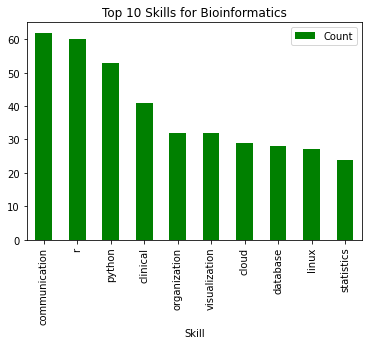

In [23]:
#Visualize the top 10 skills found across all job descriptions.
df_skillBio10.plot(x="Skill",y="Count",title="Top 10 Skills for Bioinformatics", kind="bar", color='green')

In [24]:
#Create new dataframe for a sum of skills
df_skillBio2 = pd.DataFrame(data={'Count': skillz_masterBio})
df_skillBio2 = df_skillBio2.replace(ks1_dBio)

#Create new dataframe that contains count of skills and skill name from skill dictionary
df_skill_bot10Bio = df_skillBio2['Count'].value_counts().reset_index().rename(columns={'index': 'Skill'})
df_skill_bot10Bio.tail(10)

,Skill,Count
24,numpy,5
25,sas,4
26,mathematics,4
27,nosql,3
28,github,3
29,mongodb,2
30,gcp,2
31,mysql,2
32,reporting,2
33,lambda,1


<AxesSubplot:title={'center':'Bottom 10 Skills for Bioinformatics'}, xlabel='Skill'>

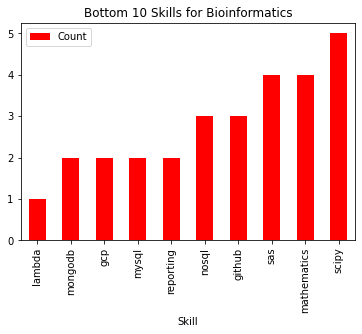

In [25]:
#Visualize the bottom 10 skills found across all job descriptions.
df_skill_bot10Bio.nsmallest(10, ['Count']).plot(x="Skill",y="Count",title="Bottom 10 Skills for Bioinformatics", kind="bar", color='red')